# Downlink TDoA Based Positioning for Millimeter Wave 5G Networks Deployed in Indoor Factory
This tutorial estimates the position of based time of arrival estimates. The details of the tutorial simulation parameters is shown below:

|Parameters|Values|
| :- | -:  |
| Positioning Method  | DL-TDoA based  |
| Parameter Estimation Method  | ESPRIT  |
| Optimization Method | Gradient Descent |
| Carrier Frequency | 28 GHz |
| Bandwidth | 100 MHz |
| Subcarrier Spacing | 120 kHz|
| Terrain | Indoor-Factory (InF-SH) |
|Channel State Information |Zero Forcing + Spline Interpolation|
| Reference Signal | Positioning Reference Signal (PRS) |
|Simulation Type| System Level Simulation|

The tutorial will generate 5G standards compliant reference signal (PRS) which is transmitted by BS foe UE to perform measurement which inturn can be used to estimate the location of the UE. Users can generate the Wireless channel either using our tool which has one of the most exhaustive channel modelling library or use some other $3^{rd}$ party tool such as Sionna, Quadriga to generate the channel and use it with 5G Toolkit. 

***Positioning Procedure***

- Generate the Reference Signal
- Transmit the Reference Signal
- Pass the Transmit Signal through Wireless Channel
- Add Noise at the Receiver
- Estimate the Channel at Pilot Locations
- Interpolate the channel at remaining locations
- Estimate the Delays (Time of arrival using the channel Estimates)
- Estimate the Position using ToA estimates.
- Select the most accurate measurements for Positioning.
- Compute Time Difference of Arrival (TDoA) measurements.
- Estimate position of the UEs based on TDoA measurements.


Finally, we will demonstrate the efficacy of these methods using simulation evaluation results: 

- Horizontal (2D) Positioning Accuracy vs SNR
- Verical Positioning Accuracy vs SNR
- 3D Positioning Accuracy

    
***Table of Content:***

* [Import Libraries](#Import-Libraries)
    - [Python Libraries](#Python-Libraries)
    - [5G Toolkit Libraries](#5G-Toolkit-Libraries)
* [Simulation Parameters](#Simulation-Parameters)
* [Channel Generation](#Channel-Generation)
* [Positioning Reference Signal](#Position-Reference-Signal)
* [OFDM Transmitter: Create Transmission Grid](#OFDM-Transmitter:-Create-Transmission-Grid)
    - [Display Transmission Grid](#Display-Transmission-Grid)
* [Transmit Beamforming](#Transmit-Beamforming)
* [Pass the Beamformed Grid Through Wireless Channel](#Pass-the-Beamformed-Grid-Through-Wireless-Channel)
* [Add Noise](#Add-Noise)
    * [Display Received Resource Grid](#Display-Received-Resource-Grid)
* [Extracting the Resource Grid](#Extracting-the-Resource-Grid)
* [Channel Estimation + Channel Interpolation](#Channel-Estimation-+-Interpolation)
    - [Display the quality of Channel Estimates](#Display-the-quality-of-Channel-Estimates)
* [ToA Estimation](#ToA-Estimation)
    - [Visualization: Time of Arrival locus Circles](#Visualization:-Time-of-Arrival-locus-Circles)
* [Position Estimation + K-Best Measurement Selection (Genie Aided)](#Position-Estimation-+-K-Best-Measurement-Selection-(Genie-Aided))
    - [Measurement-Selection](#Measurement-Selection:)
    - [Visualization of Positioning]()
* [Performance Analysis of Positioning Error for ToA based method](#Performance-Analysis-of-Positioning-Error-for-ToA-based-method)
* [Further Study](#Further-Study)


## Import Libraries
### Python Libraries

In [1]:
# from IPython.display import display, HTML
# display(HTML("<style>.container { width:80% !important; }</style>"))

import os
os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3' 

# %matplotlib widget
import matplotlib.pyplot  as plt
import matplotlib.patches as mpatches
import matplotlib as mpl

import numpy      as np
from   scipy import interpolate

### 5G Toolkit Libraries

In [2]:
from toolkit5G.ChannelModels     import AntennaArrays, SimulationLayout, ParameterGenerator, ChannelGenerator
from toolkit5G.ResourceMapping   import ResourceMapperPRS
from toolkit5G.Positioning       import ToAEstimation, PositionEstimation
from toolkit5G.ChannelProcessing import AddNoise

## Simulation Parameters

|Parameters|Values|
| :- | -:  |
| **Terrain**  | Rural Macro (RMa)  |
| **Carrier Frequency**  | 3.6 GHz |
| **Subcarrier Spacing** | 30 kHz |
| **Number of Base-station** | 21 (7 sites with 3 sectors each) |
| **BS Deployment** | Hexagonal|
|**UE Dropping**| Eqaul number of UEs are dropped uniformly at random in each Hexagonal|
| **Number of UEs** | 400|
| **Bandwidth** | 30 MHz (85 RBs) |
| **Number of RBs** | 85|

In [3]:
propTerrain      = "InF-SH"         # Propagation Scenario or Terrain for BS-UE links
carrierFrequency = 28*10**9         # Array of two carrier frequencies in GHz
scs              = 120*10**3
Nfft             = 1024
numOfBSs         = np.array([6, 3]) # number of BSs 
nBSs             = np.prod(numOfBSs)
nUEs             = 400               # number of UEs
Bandwidth        = 100*10**6
numRBs           = 85

print()
print("*****************************************************")
print("                   Terrain: "+str(propTerrain))
print("             Number of UEs: "+str(nUEs))
print("             Number of BSs: "+str(numOfBSs))
print("         carrier Frequency: "+str(carrierFrequency/10**9)+" GHz")
print("                 Bandwidth: "+str(Bandwidth))
print(" Number of Resource Blocks: "+str(numRBs))
print("        Subcarrier Spacing: "+str(scs))
print("                  FFT Size: "+str(Nfft))
print("*****************************************************")
print()


*****************************************************
                   Terrain: InF-SH
             Number of UEs: 400
             Number of BSs: [6 3]
         carrier Frequency: 28.0 GHz
                 Bandwidth: 100000000
 Number of Resource Blocks: 85
        Subcarrier Spacing: 120000
                  FFT Size: 1024
*****************************************************



## Channel Generation
### Channel Parameters:

1. Intersite Distance: 200m
2. BS is deployed at 35m and UE has a random height between 0 and 1.5m.
2. BS Antennas Arrays:
    - Antenna Types: Parabolic
    - Number of Panels: 1
    - Number of Antennas: 2 Horizontally, 2 Verically
    - Polarization: 1 (Monopole)
2. UE Antennas Arrays:
    - Antenna Types: Hertizian (Omni)
    - Number of Panels: 1
    - Number of Antennas: 4 Horizontally, 4 Verically
    - Polarization: 1 (Monopole)
3. Mobility: No Mobility
4. OFDM Channel: 
    - Carrier Phase: Disabled.
    - $\text{N}_\text{fft}$: 1024
    

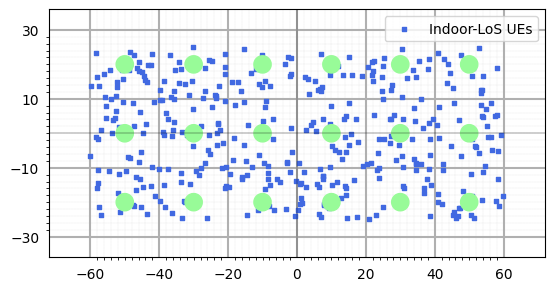

In [4]:
# Antenna Array at UE side
# assuming antenna element type to be "OMNI"
# with 2 panel and 2 single polarized antenna element per panel.
ueAntArray = AntennaArrays(antennaType = "OMNI",  centerFrequency = carrierFrequency, arrayStructure  = np.array([1,1,4,4,1]))
ueAntArray()

# # Radiation Pattern of Rx antenna element 
# ueAntArray.displayAntennaRadiationPattern()


# Antenna Array at BS side
# assuming antenna element type to be "3GPP_38.901", a parabolic antenna 
# with 4 panel and 4 single polarized antenna element per panel.
bsAntArray = AntennaArrays(antennaType = "3GPP_38.901", centerFrequency = carrierFrequency, arrayStructure  = np.array([1,1,2,2,1]))
bsAntArray()
    
# # Radiation Pattern of Tx antenna element 
# bsAntArray[0].displayAntennaRadiationPattern()

# Layout Parameters
isd                  = 20          # inter site distance
minDist              = 10          # min distance between each UE and BS 
ueHt                 = 1.5         # UE height
bsHt                 = 5          # BS height
bslayoutType         = "Rectangular" # BS layout type
ueDropType           = "Rectangular" # UE drop type
htDist               = "equal"       # UE height distribution
ueDist               = "random"       # UE Distribution per site
nSectorsPerSite      = 1             # number of sectors per site
maxNumFloors         = 1             # Max number of floors in an indoor object
minNumFloors         = 1             # Min number of floors in an indoor object
heightOfRoom         = 5.1             # height of room or ceiling in meters
indoorUEfract        = 0.5           # Fraction of UEs located indoor
lengthOfIndoorObject = 3             # length of indoor object typically having rectangular geometry 
widthOfIndoorObject  = 3             # width of indoor object
forceLOS             = True          # boolen flag if true forces every link to be in LOS state
# forceLOS             = False       # boolen flag if true forces every link to be in LOS state

# simulation layout object                                 
simLayoutObj = SimulationLayout(numOfBS = numOfBSs,
                                numOfUE = nUEs,
                                heightOfBS = bsHt,
                                heightOfUE = ueHt, 
                                ISD = isd,
                                layoutType = bslayoutType,
                                layoutWidth = 50,
                                layoutLength = 120,
                                ueDropMethod = ueDropType, 
                                UEdistibution = ueDist,
                                UEheightDistribution = htDist,
                                numOfSectorsPerSite = nSectorsPerSite,
                                ueRoute = None)

simLayoutObj(terrain = propTerrain, 
             carrierFreq = carrierFrequency, 
             ueAntennaArray = ueAntArray,
             bsAntennaArray = bsAntArray,
             indoorUEfraction = indoorUEfract,
             heightOfRoom = heightOfRoom,
             lengthOfIndoorObject = lengthOfIndoorObject,
             widthOfIndoorObject = widthOfIndoorObject,
             forceLOS = forceLOS)

# displaying the topology of simulation layout
fig, ax = simLayoutObj.display2DTopology()
ax.set_xlabel("x-coordinates (m)")
ax.set_ylabel("y-coordinates (m)")
ax.set_title("Simulation Topology")
ax.axhline(y=-0.5*isd*numOfBSs[1], xmin=10/140, xmax=130/140, color="k")
ax.axhline(y= 0.5*isd*numOfBSs[1], xmin=10/140, xmax=130/140, color="k")
ax.axvline(x=-0.5*isd*numOfBSs[0], ymin=10/140, ymax=130/140, color="k")
ax.axvline(x= 0.5*isd*numOfBSs[0], ymin=10/140, ymax=130/140, color="k")

paramGen = simLayoutObj.getParameterGenerator()

# paramGen.displayClusters((0,0,0), rayIndex = 0)
channel = paramGen.getChannel()
Hf      = channel.ofdm(scs, Nfft)[0]

Nt        = bsAntArray.numAntennas # Number of BS Antennas
Nr        = ueAntArray.numAntennas


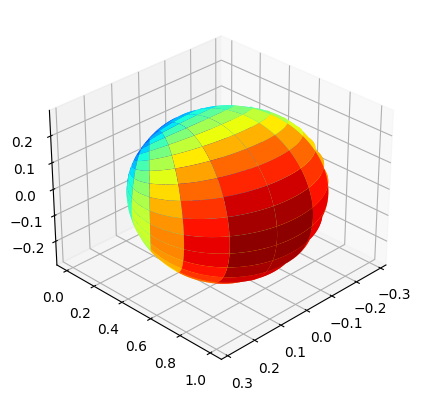

In [5]:
bsAntArray.displayAntennaRadiationPattern()

## Position Reference Signal

* Number of OFDM symbols occupied by PRS: `dl_PRS_NumSymbols`
* COMB size-N for PRS Transmission: `dl_PRS_CombSizeN`
* PRS symbol offset: `dl_PRS_ResourceSymbolOffset`
* Resource Element offset in PRS: `dl_PRS_ReOffset`
* PRS Resource-ID: `dl_PRS_SequenceID`
* Index of the Slot which will carry the PRS resource Grid: `slotNumber`
* Power scaling factor of PRS per ofdm symbol: `betaPRS`
* **PRS Resource Grid**: (prsGrid) - $\text{N}_\text{BS} \times 14*\text{numSlots} \times 12*\text{numRBs}$

In [6]:
dl_PRS_NumSymbols           = 12   # Number of OFDM symbols occupied by PRS
dl_PRS_CombSizeN            = 12   #12 # COMB size-N
dl_PRS_ResourceSymbolOffset = 0    # PRS symbol offset
dl_PRS_ReOffset             = 0    # RE offset in PRS    # not considered
dl_PRS_SequenceID           = 1031 # PRS Sequence ID.

# Number of slots per frame
numBSsPerSlot               = dl_PRS_CombSizeN
numSlots                    = int(np.ceil(nBSs/numBSsPerSlot))
slotNumber                  = 9    # Index of slot where the PRS is loaded
betaPRS                     = 1    # power scaling factor of PRS per ofdm symbol

prsGrid   = np.zeros((nBSs, numSlots, 14, numRBs*12), dtype = np.complex64)
prsObject = np.empty((nBSs), dtype=object)
resGrid   = np.zeros((numSlots, 14, 12), dtype = np.int8)
for nbs in range(nBSs):
# Object for generating the PRS Resource Grid
    slotIndex      = int(nbs/numBSsPerSlot)
    prsObject[nbs] = ResourceMapperPRS(betaPRS, dl_PRS_CombSizeN, dl_PRS_ReOffset + int(nbs%numBSsPerSlot),
                                       dl_PRS_ResourceSymbolOffset, dl_PRS_NumSymbols, dl_PRS_SequenceID+nbs)
    # Generate the PRS Resource Grid
    prsGrid[nbs, slotIndex]   = prsObject[nbs](slotNumber+slotIndex, numRBs)
    
    resGrid[slotIndex] = resGrid[slotIndex] + np.round(np.abs(prsGrid[nbs, slotIndex]))[:,0:12]*(nbs+1)

prsGrid = prsGrid.reshape(nBSs, -1, numRBs*12)
resGrid = resGrid.reshape(-1, 12)

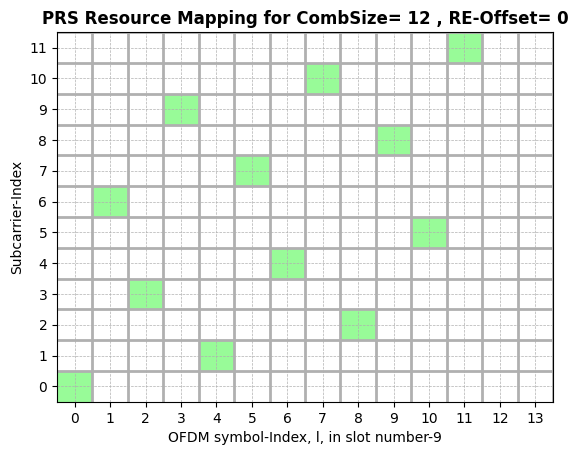

In [7]:
f,a = prsObject[0].displayResourceGrid() # Display PRS Resource Grid

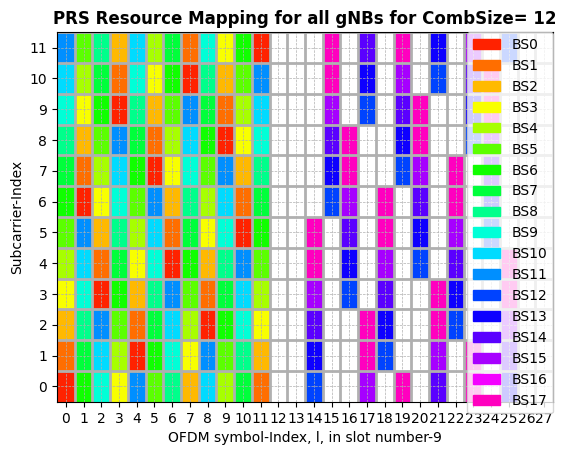

In [8]:
fig, ax = plt.subplots()
colors  = ['white', 'red', 'lightcoral', 'gold', 'midnightblue', 'purple','black','darkorange', 'green', 'magenta', 'brown', 'yellow', 'pink']
bounds  = np.arange(1, nBSs+1)
bounds  = np.append([0], bounds)
cmap      = plt.get_cmap('gist_rainbow')
colors    = cmap(np.linspace(0,1,nBSs+1))
colors[0] = 0
option  = "limited"
combSize = dl_PRS_CombSizeN


cmap    = mpl.colors.ListedColormap(colors)
norm    = mpl.colors.BoundaryNorm(bounds, cmap.N)

ax.imshow(np.abs(resGrid.T), interpolation='none', cmap=cmap, norm=norm, aspect = "auto", origin='lower')
ax.set_yticks(np.arange(0.5, 12, 1), minor=True);
ax.set_yticks(np.arange(0, 12, 1), minor=False);
ax.set_xticks(np.arange(0.5, 14*numSlots, 1), minor=True);
ax.set_xticks(np.arange(0, 14*numSlots, 1), minor=False);
ax.tick_params(axis='both',which='minor', grid_linewidth=2, width=0)
ax.tick_params(axis='both',which='major', grid_linewidth=0.5, grid_linestyle = '--')

ax.set_title("PRS Resource Mapping for all gNBs for CombSize= "+str(combSize), fontweight ='bold')
ax.set_xlabel('OFDM symbol-Index, l, in slot number-'+str(slotNumber))
ax.set_ylabel('Subcarrier-Index')

patches = [ mpatches.Patch(color=colors[i], label="BS"+str(i-1)) for i in range(1,nBSs+1) ]
# put those patched as legend-handles into the legend
ax.legend(handles=patches, loc='best', borderaxespad=0. )

plt.grid(which='both')
plt.show()

## OFDM Transmitter: Create Transmission Grid

* Transmission Grid: `XGrid`
* Bandwidth RE Offset: `bwpOffset`

In [9]:
XGrid     = np.zeros((nBSs, 14*numSlots, Nfft), dtype = np.complex64)
bwpOffset = np.random.randint(Nfft-numRBs*12)

## Load the resource grid to Transmission Grid
XGrid[...,bwpOffset:(bwpOffset+numRBs*12)] = prsGrid


print()
print("*****************************************************")
print("      Size of the Transmission Grid:  "+str(XGrid.shape))
print("         BWP Resoure Element Offset:  "+str(bwpOffset))
print("      Size of the PRS-Resource Grid:  "+str(prsGrid.shape))
print("*****************************************************")
print()


*****************************************************
      Size of the Transmission Grid:  (18, 28, 1024)
         BWP Resoure Element Offset:  1
      Size of the PRS-Resource Grid:  (18, 28, 1020)
*****************************************************



### Display Transmission Grid

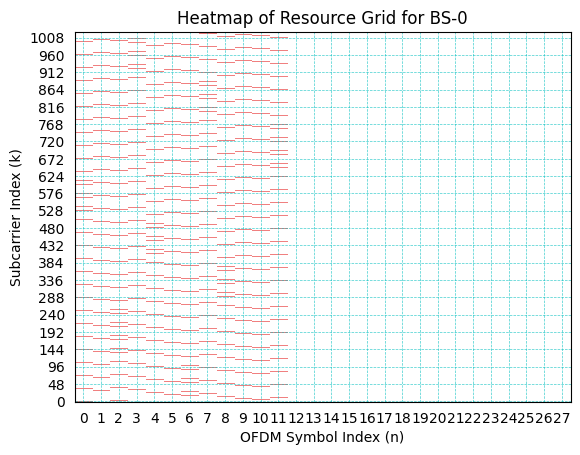

In [10]:
# Plot Resource Grid
#################################################################
bsIndex = 0
fig, ax = plt.subplots()
colors  = ['palegreen', 'white', 'lightcoral', 'gold', 'midnightblue', 'purple']
bounds  = [-1, 0, 1, 2, 3, 4, 5]

cmap    = mpl.colors.ListedColormap(colors)
norm    = mpl.colors.BoundaryNorm(bounds, cmap.N)
ax.imshow(np.round(np.abs(XGrid[bsIndex].T)), cmap = cmap, interpolation='none',
          norm=norm, aspect = "auto", origin='lower')
ax.set_yticks(np.arange(0.5, 12*numRBs, 48), minor=False);
# ax.set_yticks(np.arange(0, 12, 1), minor=False);
# ax.set_xticks(np.arange(0.5, 14*numSlots, 1), minor=True);
ax.set_xticks(np.arange(0, 14*numSlots, 1), minor=False);
# ax.tick_params(axis='both',which='minor', grid_linewidth=2, width=0)
ax.tick_params(axis='both',which='major', grid_alpha = 0.75, 
               grid_linewidth=0.05, width=0, grid_linestyle = '--')
ax.set_xlabel("OFDM Symbol Index (n)")
ax.set_ylabel("Subcarrier Index (k)")
ax.set_title("Heatmap of Resource Grid for BS-"+str(bsIndex))
ax = plt.gca()
ax.grid(color='c', linestyle='--', linewidth=0.5)
# Gridlines based on minor ticks
plt.show()

## Transmit Beamforming

1. Transmit Power, $P_t$ (dBm)
2. Inter-Antenna spacing, d (m)
3. Beamformed Grid, Xf
4. Beamforming Direction: (0,0)

In [11]:
#################################################################
# Bemforming angles
# Inter-element spacing in vertical and horizontal
Pt_dBm= 53
Pt    = 10**(0.1*(Pt_dBm-30))
lamda = 3*10**8/carrierFrequency
d     = 0.5/lamda
theta = 0
# Wt    = np.sqrt(Pt/Nt)*np.exp(1j*2*np.pi*d*np.cos(theta)/(lamda*Nt)*np.arange(0,Nt))
# Xf    = Wt.reshape(-1,1,1)*XGrid1
Xf    = XGrid[..., np.newaxis].repeat(Nt, axis = -1)

print(" Beamformed Grid: "+str(Xf.shape))

 Beamformed Grid: (18, 28, 1024, 4)


## Pass the Beamformed Grid Through Wireless Channel

1. OFDM Channel, Hf:  (Number of Symbols (1), Number of BSs, Number of UEs, Nfft, Number of Rx Antennas, Number Tx Antennas)
2. Transmit Grid, Xf: (Number of BSs, Number of Tx Antennas, Number of Symbols, Nfft)
3. Received Grid, Y:  (Number of UEs, Number of Rx Antennas, Number of Symbols, Nfft)

``Note:`` Static Wireless Channel (No mobility is considered)

In [12]:
Y = np.zeros((nUEs, Nr, 14*numSlots, Nfft), dtype=np.complex64)

for lbs in range(nBSs):
    for lue in range(nUEs):
        Y[lue] = Y[lue] + (Hf[0,lbs, lue][:,np.newaxis,...]@Xf[lbs].transpose(1,0,2)[...,np.newaxis])[...,0].transpose(-1,1,0)


print()
print("*****************************************************")
print("          Size of the Channel: "+str(Hf.shape))
print("Size of the Transmited Signal: "+str(Xf.shape))
print("  Size of the Received Signal: "+str(Y.shape))
print("*****************************************************")
print()


*****************************************************
          Size of the Channel: (1, 18, 400, 1024, 16, 4)
Size of the Transmited Signal: (18, 28, 1024, 4)
  Size of the Received Signal: (400, 16, 28, 1024)
*****************************************************



## Add Noise

- Noise Variance: $k_B$ * T * B where
    * $k_B$: Boltzmann Constant: $1.380649 \times 10^{-23}$
    * T: Temperature: 300 K
    * B: Bandwidth: 30 MHz
- Carrier Frequency Offset: **Not considered in this simulation**
    * kppm (CFO in ppm of carrier frequency): 0 
    * CFO 
    
- Received Grid with Noise (Yf)

In [13]:
BoltzmanConst = 1.380649*(10**(-23))
temperature   = 300
noisePower    = BoltzmanConst*temperature*Bandwidth
kppm          = 0
fCFO          = kppm*(np.random.rand()-0.5)*carrierFrequency*(10**(-6)); # fCFO = CFO*subcarrierSpacing
CFO           = (fCFO/scs)/Nfft
##Yf            = AddNoise(True)(Y, noisePower, CFO)

Yf            = AddNoise(False)(Y, noisePower, 0)    #Added

### Display Received Resource Grid 

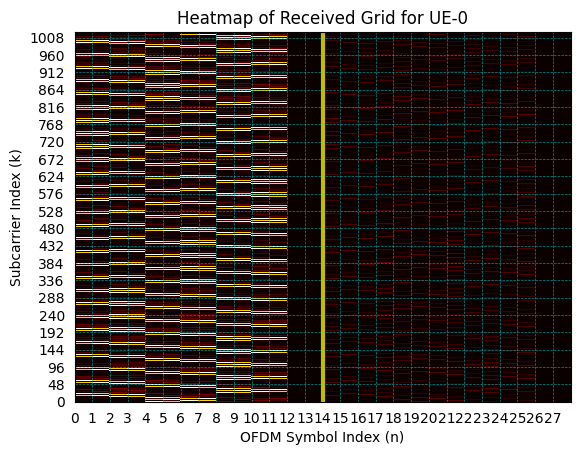

In [14]:
# Plot Resource Grid
#################################################################
ueIndex = 0
fig, ax = plt.subplots()
# colors  = ['palegreen', 'white', 'lightcoral', 'gold', 'midnightblue', 'purple']
# bounds  = [-1, 0, 1, 2, 3, 4, 5]

cmap    = mpl.colors.ListedColormap(colors)
norm    = mpl.colors.BoundaryNorm(bounds, cmap.N)
ax.pcolor(np.abs(Yf[ueIndex,0].T), cmap = "hot")
ax.axvline(x=14, color = 'y', lw = 3)
ax.set_yticks(np.arange(0.5, 12*numRBs, 48), minor=False);
# ax.set_yticks(np.arange(0, 12, 1), minor=False);
# ax.set_xticks(np.arange(0.5, 14*numSlots, 1), minor=True);
ax.set_xticks(np.arange(0, 14*numSlots, 1), minor=False);
# ax.tick_params(axis='both',which='minor', grid_linewidth=2, width=0)
ax.tick_params(axis='both',which='major', grid_alpha = 0.75, 
               grid_linewidth=0.05, width=0, grid_linestyle = '--')
ax.set_xlabel("OFDM Symbol Index (n)")
ax.set_ylabel("Subcarrier Index (k)")
ax.set_title("Heatmap of Received Grid for UE-"+str(ueIndex))
ax = plt.gca()
ax.grid(color='c', linestyle='--', linewidth=0.5)
# Gridlines based on minor ticks
plt.show()

## Extracting the Resource Grid

In [15]:
rxGrid = Yf[...,bwpOffset:(bwpOffset+numRBs*12)]

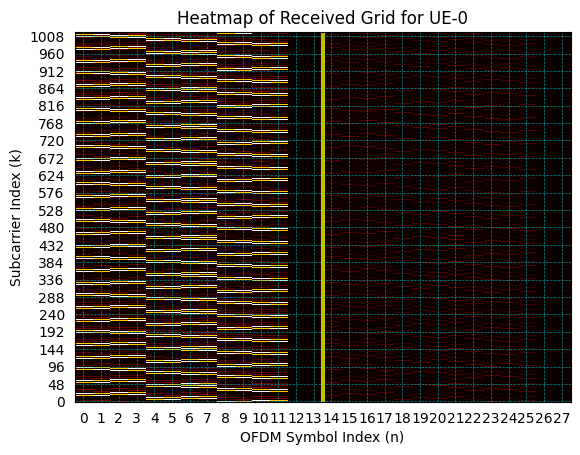

In [16]:
# Plot Resource Grid
#################################################################
fig, ax = plt.subplots()
# colors  = ['palegreen', 'white', 'lightcoral', 'gold', 'midnightblue', 'purple']
# bounds  = [-1, 0, 1, 2, 3, 4, 5]

cmap    = mpl.colors.ListedColormap(colors)
norm    = mpl.colors.BoundaryNorm(bounds, cmap.N)
plt.imshow(np.abs(rxGrid[0,0].T), cmap = "hot", interpolation='none', aspect = "auto", origin='lower')
ax.axvline(x=13.5, color = 'y', lw = 3)
ax.set_yticks(np.arange(0.5, 12*numRBs, 48), minor=False);
# ax.set_yticks(np.arange(0, 12, 1), minor=False);
# ax.set_xticks(np.arange(0.5, 14*numSlots, 1), minor=True);
ax.set_xticks(np.arange(0, 14*numSlots, 1), minor=False);
# ax.tick_params(axis='both',which='minor', grid_linewidth=2, width=0)
ax.tick_params(axis='both',which='major', grid_alpha = 0.75, 
               grid_linewidth=0.05, width=0, grid_linestyle = '--')
ax.set_xlabel("OFDM Symbol Index (n)")
ax.set_ylabel("Subcarrier Index (k)")
ax.set_title("Heatmap of Received Grid for UE-"+str(ueIndex))
ax = plt.gca()
ax.grid(color='c', linestyle='--', linewidth=0.5)
# Gridlines based on minor ticks
plt.show()

## Channel Estimation + Interpolation

- Channel estimation using zero-forcing/Least squares
- Interpolation using spline interpolation from SciPy (splrep, splev)
- Measurements across time are aggregated to improve the quality of channel estimates.
    - As the channel is no varying accross time.

In [17]:
rxGrid  = rxGrid.reshape(nUEs, Nr, numSlots, 14, numRBs*12)
prsGrid = prsGrid.reshape(nBSs, numSlots, 14, numRBs*12)
overSamplingFactor = 1
sA    = 0
sP    = 0
Hfest = np.zeros((nBSs, nUEs, Nr, 14, 12*numRBs), dtype=np.complex64)
Hfint = np.zeros((nBSs, nUEs, Nr, overSamplingFactor*12*numRBs), dtype=np.complex64)

for lbs in range(nBSs):
    slotIndex   = int(lbs/numBSsPerSlot)
    for lue in range(nUEs):
#         print("lbs, lue",lbs, lue)
        for nr in range(Nr):
            Hfest[lbs, lue, nr][prsObject[lbs].prsIndices] = rxGrid[lue, nr, slotIndex][prsObject[lbs].prsIndices]/prsGrid[lbs, slotIndex][prsObject[lbs].prsIndices]
            H   = np.sum(Hfest[lbs, lue, nr], axis = -2)
            tck = interpolate.splrep(np.arange(0, overSamplingFactor*12*numRBs, overSamplingFactor), np.abs(H), s=sA)
            amp = interpolate.splev( np.arange(0, overSamplingFactor*12*numRBs), tck, der=0)
            tck = interpolate.splrep(np.arange(0, overSamplingFactor*12*numRBs, overSamplingFactor), np.unwrap(np.angle(H)), s=sP)
            Hfint[lbs, lue, nr] = amp * np.exp(1j*interpolate.splev(np.arange(0, overSamplingFactor*12*numRBs), tck, der=0))
            

### Display the quality of Channel Estimates

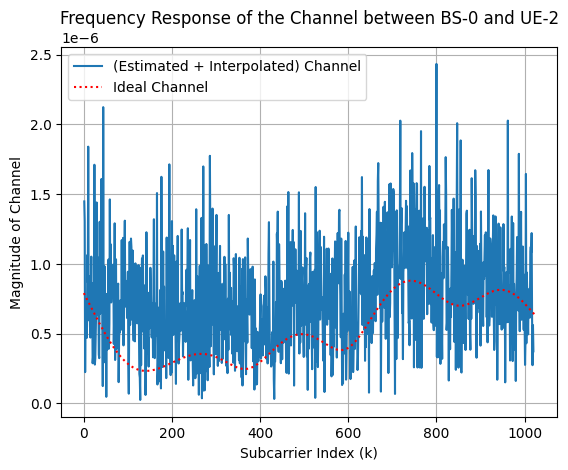

In [18]:
bsIndex = 0
ueIndex = 2
antIdx  = 0

fig, ax = plt.subplots()

ax.plot(np.arange(bwpOffset, bwpOffset+12*numRBs, overSamplingFactor), np.abs(Hfint[bsIndex, ueIndex, antIdx]), label = "(Estimated + Interpolated) Channel")
ax.plot(np.arange(0, Nfft, 1), np.abs(np.sum(Hf[0,bsIndex, ueIndex][:,antIdx,:], axis= -1)), "r:", label = "Ideal Channel")
ax.legend(loc = 'best')
ax.set_xlabel("Subcarrier Index (k)")
ax.set_ylabel("Magnitude of Channel")
ax.set_title("Frequency Response of the Channel between BS-"+str(bsIndex)+" and UE-"+str(ueIndex))
ax.grid()
plt.show()

## ToA Estimation

|Parameters|Values|
| :- | -:  |
| **ToA Estimation Method**  | ESPRIT  |
| **Number of Path-delays estimated**  | 3 (incremented if ESPRIT doesn't provide legit delays) |

**Note**: 

- ESPRIT has high time and memory-space complexity 
- But yeild better ToA estimates in comparison to *MUSIC* and *DFT* based based methods if sufficent diversity is avaiable across measurements (space diversity in this case). 
- Furthermore, it has very few hyper-parameters required to be passed as input.

In [20]:
toaEstimation = ToAEstimation("ESPRIT", Hfint[0, 0].reshape(-1,overSamplingFactor*12*numRBs).T.shape)
ToAe          = np.zeros(Hfint.shape[0:2])

Lpath         = 2
for nbs in range(nBSs):
    for nue in range(nUEs):
#         print("(nbs, nue): ("+str(nbs)+", "+str(nue)+")")
        delayEstimates = np.sort(toaEstimation(Hfint[nbs, nue].reshape(-1,overSamplingFactor*12*numRBs).T, 
                                               Lpath, 
                                               subCarrierSpacing = scs/overSamplingFactor))
        delayEstimates = delayEstimates[delayEstimates > 0]
        K = Lpath
        while((delayEstimates.size==0) or (delayEstimates[0]<=0 and K < 12)):
            K = K + 1
            delayEstimates = np.sort(toaEstimation(Hfint[nbs, nue].reshape(-1,overSamplingFactor*12*numRBs).T, 
                                                   numberOfPath = K, 
                                                   subCarrierSpacing = scs/overSamplingFactor))
            delayEstimates = delayEstimates[delayEstimates > 0]
        if(delayEstimates.size == 0):
            ToAe[nbs, nue] = 10**-9
        else:
            ToAe[nbs, nue] = delayEstimates[0]
            

### Visualization: Time of Arrival locus Circles
Display the locus for all the circle with radius $= 3 \times 10^{8} \times$ ToA. The circle denotes te possible location of UEs. The UE actually lies at the intersection of the circle drawn around the BS correspsonding to ToA-measurement for the specific UE.

/home/tenet/miniconda3/envs/myRaw/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


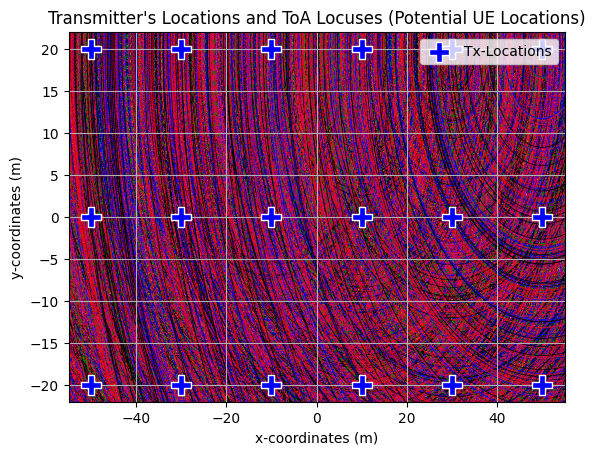

In [21]:
#################################################################
rxPosition  = simLayoutObj.UELocations
txPosition  = simLayoutObj.BSLocations
rangeEst_2D = np.sqrt(np.abs((ToAe*(3*10**8))**2 - (rxPosition[:,2].reshape(1,-1)-txPosition[:,2].reshape(-1,1))**2))

fig, ax = plt.subplots()
colors  = ["k","m","r","b","g","y","crimson"]

linestyle_tuple = ['solid', 'dotted', 'dashed', 'dashdot', 
                   (0, (5, 10)),                # 'loosely dashed'
                   (0, (1, 10)),                # 'loosely dotted'
                   (5, (10, 3)),                # 'long dash with offset'
                   (0, (5, 1)),                 # 'densely dashed'
                   (0, (3, 10, 1, 10)),         # 'loosely dashdotted'
                   (0, (3, 5, 1, 5)),           # 'dashdotted'
                   (0, (3, 1, 1, 1)),           # 'densely dashdotted'
                   (0, (3, 5, 1, 5, 1, 5)),     # 'dashdotdotted'
                   (0, (3, 10, 1, 10, 1, 10)),  # 'loosely dashdotdotted'
                   (0, (3, 1, 1, 1, 1, 1))]     # 'densely dashdotdotted'

for nbs in range(nBSs):
    for nue in range(nUEs):
            circle1 = plt.Circle((txPosition[nbs,0], txPosition[nbs,1]), rangeEst_2D[nbs,nue], 
                                 color = colors[nue%7], lw = 0.5, ls = linestyle_tuple[nue%7], 
                                 fill = False, zorder = 1)
            ax.add_artist(circle1)

ax.scatter(txPosition[:,0], txPosition[:,1], marker="P", color="b", edgecolors='white', s = 200, label="Tx-Locations", zorder = 2)
ax.legend()
ax.set_xlabel("x-coordinates (m)")
ax.set_ylabel("y-coordinates (m)")
ax.set_title("Transmitter's Locations and ToA Locuses (Potential UE Locations)")
ax.grid(True)
plt.show()
#________________________________________________________________

## Position Estimation + K-Best Measurement Selection (Genie Aided)

### Measurement Selection:

- Select the most accurate k ToA measnurements for Positioning
- Even 1 Inaccuracte measurement can compromise the positioning performance.
- **Genie Aided Measurement Selection**: Assumes that the accuracy of the each measurment is known somehow.
    * Selects the best ToA-measurements available to each UE from the BSs for estimating the location.
    

In [22]:
# Selection of k Most Accurate Measurements

k         = 6  # Select k-best measurements
error     = (np.abs(ToAe-channel.delays[0,0,...,0])/channel.delays[0,0,...,0]) # Compute the ToA error in each measurement
bsIndices = (np.argsort(error,axis=0)[0:k]).T

# Position Estimation based on TDoA

positionEstimate = PositionEstimation(positioningMethod = "TDOA", 
                                      optimizationMethod = "NewtonRaphson",
                                      numIterationPerEpoch = 10000, numEpochs = 10,
                                      tolerance = 0.0000000001, stepsize = 0.1)
# Position Estimation Object: 
    # Positioning based on: TDoA
    # Optimization Method: Gradient Descent

rxPositionEstimate = np.zeros((nUEs, 3))
rxStdEstimate      = np.zeros((nUEs))

for nue in range(nUEs):
#     print("ue-Index: "+str(nue))
    toa  = ToAe[bsIndices[nue],nue]
    tdoa = toa[1::] - toa[0]
    rxPositionEstimate[nue] = positionEstimate(txPosition[bsIndices[nue]], tdoa=tdoa).flatten()

### Visualization of Positioning
- Show the accurcy of positioning by comparing the actual location against the true location.

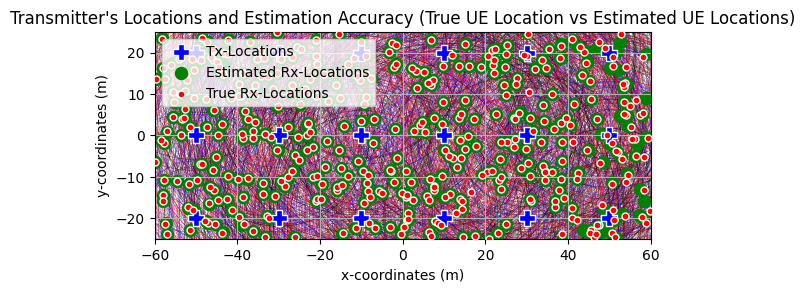

In [30]:
## PSS Detection Plot
#################################################################
rxPosition  = simLayoutObj.UELocations
txPosition  = simLayoutObj.BSLocations
rangeEst_2D = np.sqrt(np.abs((ToAe*(3*10**8))**2 - (rxPosition[:,2].reshape(1,-1)-txPosition[:,2].reshape(-1,1))**2))

fig, ax = plt.subplots()
ax.set_aspect(True)
# fig, ax = simLayoutObj.display2DTopology(isEqualAspectRatio = True)
colors  = ["k","m","r","b","g","y","crimson"]

linestyle_tuple = ['solid', 'dotted', 'dashed', 'dashdot', 
                   (0, (5, 10)),                # 'loosely dashed'
                   (0, (1, 10)),                # 'loosely dotted'
                   (5, (10, 3)),                # 'long dash with offset'
                   (0, (5, 1)),                 # 'densely dashed'
                   (0, (3, 10, 1, 10)),         # 'loosely dashdotted'
                   (0, (3, 5, 1, 5)),           # 'dashdotted'
                   (0, (3, 1, 1, 1)),           # 'densely dashdotted'
                   (0, (3, 5, 1, 5, 1, 5)),     # 'dashdotdotted'
                   (0, (3, 10, 1, 10, 1, 10)),  # 'loosely dashdotdotted'
                   (0, (3, 1, 1, 1, 1, 1))]     # 'densely dashdotdotted'

for nbs in range(k):
    for nue in range(nUEs):
            circle1 = plt.Circle((txPosition[bsIndices[nue, nbs], 0], txPosition[bsIndices[nue, nbs], 1]), rangeEst_2D[bsIndices[nue, nbs], nue], 
                                 color = colors[nue%7], lw = 0.2, ls = linestyle_tuple[nue%7], fill = False, zorder = 0)
            ax.add_artist(circle1)

ax.scatter(txPosition[:,0], txPosition[:,1], marker="P", color="b", edgecolors='white', 
           s = 125, label="Tx-Locations", zorder = 3)
ax.scatter(rxPositionEstimate[:,0], rxPositionEstimate[:,1], marker="o", color="g", 
           s = 75, label="Estimated Rx-Locations", zorder = 1)
ax.scatter(rxPosition[:,0], rxPosition[:,1], marker=".", color="r", edgecolors='white', 
           s = 100, label="True Rx-Locations", zorder = 5)
ax.legend()
ax.set_xlabel("x-coordinates (m)")
ax.set_ylabel("y-coordinates (m)")
ax.set_title("Transmitter's Locations and Estimation Accuracy (True UE Location vs Estimated UE Locations)")
ax.set_xlim([-60, 60])
ax.set_ylim([-25, 25])
ax.grid(True)
plt.show()

## Performance Analysis of Positioning Error for ToA based method
The perfrormance of the positioning methods is analyzed using:

1. 50 percentile Position Error in Horizontal and Vertical Direction.
2. 67 percentile Position Error in Horizontal and Vertical Direction.
3. 90 percentile Position Error in Horizontal and Vertical Direction.
4. Fraction of users which are positioned with accuracy better ththan 50 cm.

It can be easily observed that:

|Error Percentile | Horizontal Error| Vertical Error|
| :- | -:  | -:|
| **50%ile**  | 8.5 cm  | 13.5cm |
| **66%ile**  | 16.5cm  | 20.0cm |
| **90%ile**  | 19.6cm  | 33.1cm |


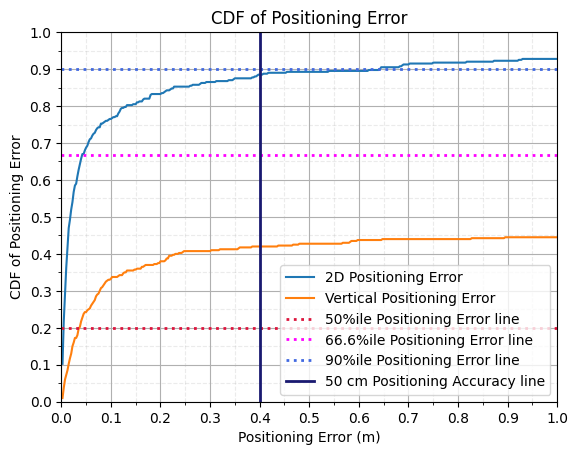

In [24]:
nbins = nUEs
xlimit = 1
ylimit = 1
posError3D = np.linalg.norm(rxPositionEstimate-rxPosition, axis=1)
posError3D = np.where(np.isnan(posError3D), 0, posError3D)
posError2D = np.linalg.norm(rxPositionEstimate[:, 0:2]-rxPosition[:, 0:2], axis=1)

# Horizontal Error
count, bins_count = np.histogram(posError2D, bins = nbins, range = [0, 1])
pdf = count/nUEs
cdf = np.cumsum(pdf)

fig, ax = plt.subplots()
ax.plot(bins_count[1:], cdf, label = "2D Positioning Error")



# Vertical Error
count, bins_count = np.histogram(posError3D, bins = nbins, range = [0, 1])
pdf = count/nUEs
cdf = np.cumsum(pdf)
ax.plot(bins_count[1:], cdf, label = "Vertical Positioning Error")

ax.set_xticks(np.linspace(0, xlimit, 11))
ax.set_xticks(np.linspace(0, xlimit, 21), minor=True)
ax.set_yticks(np.linspace(0, ylimit, 11))
ax.set_yticks(np.linspace(0, ylimit, 21), minor=True)
ax.set_xlabel("Positioning Error (m)")
ax.set_ylabel("CDF of Positioning Error")
ax.set_title("CDF of Positioning Error")
ax.axhline(y = 0.2, lw = 2, alpha = 1, linestyle = ':', color = "crimson", label = "50%ile Positioning Error line")
ax.axhline(y = 2/3, lw = 2, alpha = 1, linestyle = ':', color = "magenta", label = "66.6%ile Positioning Error line")
ax.axhline(y = 0.9, lw = 2, alpha = 1, linestyle = ':', color = "royalblue", label = "90%ile Positioning Error line")
ax.axvline(x = 0.4, lw = 2, alpha = 1, linestyle = '-', color = "midnightblue", label = "50 cm Positioning Accuracy line")

# Specify different settings for major and minor grids
ax.grid(which = 'minor', alpha = 0.25, linestyle = '--')
ax.grid(which = 'major', alpha = 1)

ax.set_xlim([0,xlimit])
ax.set_ylim([0,ylimit])
ax.legend()
plt.show()

## Further Study
The tutorial can be extended further to study the effect of:

- Subcarrier Spacing ($\Delta f$)
- Carrier Frequency ($f_c$)
- Bandwidth ($B$)
- NLoS Probability ($p_{LOS}$)
- Transmitter Power ($P_t$)
- Number of Base-stations ($N_{BS}$)
- Comb-factor ($K_{comb}$)

on positioning accuracy. Furthermore, different terrians have different propagation characteristics. These characteristics effect the accuracy of positioning.

``Thanks for reading the tutorial!``